In [1]:
import os
import yaml
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
import seaborn as sns
import matplotlib.patches as patches
from ultralytics import YOLO
import cv2
import torch
from PIL import Image
import torch.optim as optim

import albumentations as A
from albumentations.pytorch import ToTensorV2

# Check PyTorch version and CUDA availability
print(torch.__version__)
print(torch.cuda.is_available())

2.4.1+cu121
True


/home2/minorai4/.local/lib/python3.11/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Define directories and classes
image_dir = r'datasets/images/'
label_dir = r'datasets/labels/'
output_dir = 'datasets/augmented'


classes = ['StopBord', 'VoorrangsWegBord']

# Confirm output directory path (no need to save files here)
print(f"Original images are located in: {image_dir}")

# Check PyTorch version and CUDA availability
print(torch.__version__)
print(torch.cuda.is_available())


Original images are located in: datasets/images/
2.4.1+cu121
True


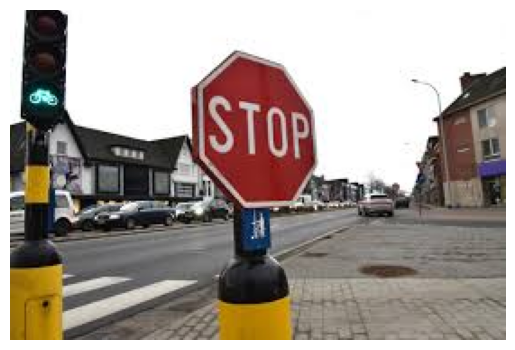

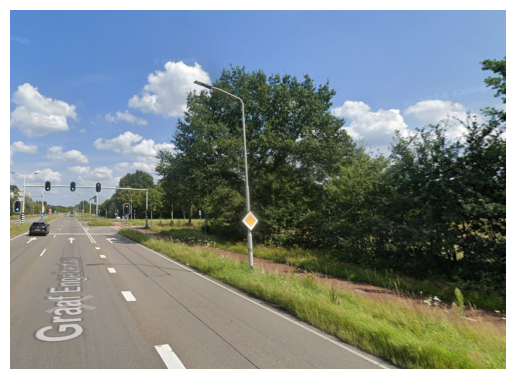

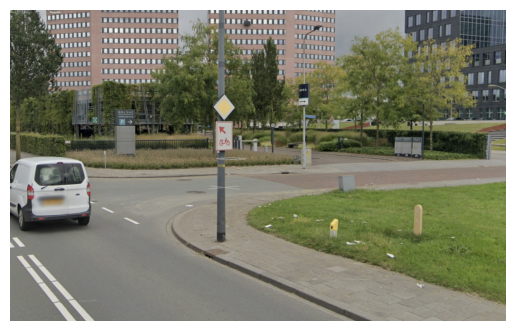

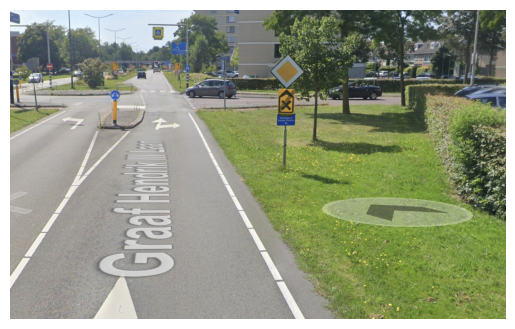

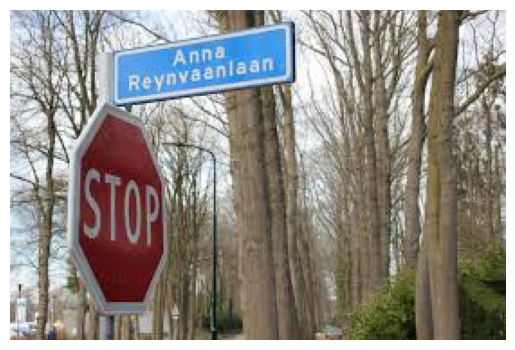

In [3]:
# Data exploration
# Load data.yaml
with open('data.yaml', 'r') as file:
    data = yaml.safe_load(file)

# Paths to your dataset
train_images_dir = 'datasets/' + data['train'] 
val_images_dir = 'datasets/' + data['val']      

# Function to display images
def show_image(image_path):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib
    plt.imshow(img_rgb)
    plt.axis('off')  # Hide axes
    plt.show()

# Get random images from the dataset
def display_random_images(image_dir, num_images=5):
    image_files = os.listdir(image_dir)
    random_images = random.sample(image_files, num_images)
    
    for image_file in random_images:
        image_path = os.path.join(image_dir, image_file)
        show_image(image_path)

# Show random images from the training set
display_random_images(train_images_dir, num_images=5)

In [4]:
# Set the device to the second GPU (GPU 1)
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model = YOLO("yolo11n.pt")
model.to(device)

print("Model bound to device")

Using device: cuda:1
Model bound to device


In [5]:
# Tune the model
# model.tune(
   # data="data.yaml",
   # epochs=30, 
   # iterations=300
#)

In [6]:
results = model.train(
    data="data.yaml",
    epochs=200,
    imgsz=512,
    batch=16,
    patience=30,
    augment=True,  # Enable default augmentation
)

# Output training completion
print("Training completed with customized dynamic augmentation enabled.")

New https://pypi.org/project/ultralytics/8.3.13 available 😃 Update with 'pip install -U ultralytics'
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=200, time=None, patience=30, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=cuda:1, workers=8, project=None, name=train70, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_

train: Scanning /home2/minorai4/ml3/datasets/labels/train.cache... 99 images, 0 backgrounds, 1 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]

train: WARNING ⚠️ /home2/minorai4/ml3/datasets/images/train/15d61c59-B7_055.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'webp', 'jpeg', 'bmp', 'dng', 'mpo', 'tif', 'pfm', 'tiff', 'jpg', 'png'}
videos: {'mkv', 'mpeg', 'mov', 'avi', 'm4v', 'webm', 'mpg', 'ts', 'mp4', 'wmv', 'gif', 'asf'}
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /home2/minorai4/ml3/datasets/labels/val.cache... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<?, ?it/s]


Plotting labels to runs/detect/train70/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 8 dataloader workers
Logging results to runs/detect/train70
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200         0G      1.155      3.891      1.057          3        512: 100%|██████████| 7/7 [00:01<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.27it/s]

                   all         20         22    0.00268      0.682     0.0043    0.00228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200         0G      1.018      3.209     0.9807          7        512: 100%|██████████| 7/7 [00:00<00:00, 16.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.18it/s]

                   all         20         22    0.00258      0.682      0.256      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200         0G      1.116      2.092      1.052          5        512: 100%|██████████| 7/7 [00:00<00:00, 16.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.26it/s]

                   all         20         22    0.00351      0.955      0.301      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200         0G      1.021       1.62      1.012          5        512: 100%|██████████| 7/7 [00:00<00:00, 17.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.07it/s]

                   all         20         22    0.00367          1      0.291      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200         0G      1.076      1.443     0.9697          9        512: 100%|██████████| 7/7 [00:00<00:00, 17.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.92it/s]

                   all         20         22    0.00339      0.909     0.0224      0.018



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200         0G     0.9395      1.413     0.9485          5        512: 100%|██████████| 7/7 [00:00<00:00, 17.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.98it/s]

                   all         20         22    0.00343      0.909    0.00865    0.00534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200         0G       1.08      1.426      1.011          6        512: 100%|██████████| 7/7 [00:00<00:00, 17.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.86it/s]

                   all         20         22    0.00333      0.909      0.112     0.0921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200         0G      1.058      1.306      0.989          3        512: 100%|██████████| 7/7 [00:00<00:00, 18.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.52it/s]

                   all         20         22     0.0035      0.955      0.293      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200         0G      1.059      1.319       1.03          5        512: 100%|██████████| 7/7 [00:00<00:00, 17.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.76it/s]

                   all         20         22    0.00353      0.955       0.26      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200         0G     0.9487      1.184     0.9642          8        512: 100%|██████████| 7/7 [00:00<00:00, 18.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.40it/s]

                   all         20         22    0.00366      0.955      0.604      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200         0G     0.9928      1.317     0.9524         10        512: 100%|██████████| 7/7 [00:00<00:00, 18.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.23it/s]

                   all         20         22          1      0.265        0.5      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200         0G      1.012      1.297     0.9894          8        512: 100%|██████████| 7/7 [00:00<00:00, 17.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.68it/s]

                   all         20         22      0.929      0.273      0.887      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200         0G      1.007       1.16     0.9296          7        512: 100%|██████████| 7/7 [00:00<00:00, 18.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.80it/s]

                   all         20         22      0.843      0.273      0.769       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200         0G      1.142      1.333      1.047          6        512: 100%|██████████| 7/7 [00:00<00:00, 18.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.28it/s]

                   all         20         22      0.952      0.595      0.924      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200         0G      1.096      1.272      1.004          6        512: 100%|██████████| 7/7 [00:00<00:00, 16.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.39it/s]

                   all         20         22       0.82      0.519      0.914      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200         0G     0.9921      1.155     0.9558          7        512: 100%|██████████| 7/7 [00:00<00:00, 18.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.63it/s]

                   all         20         22      0.766      0.881      0.929      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200         0G     0.9954      1.121     0.9652          9        512: 100%|██████████| 7/7 [00:00<00:00, 18.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.89it/s]

                   all         20         22      0.878       0.99      0.991      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200         0G      1.047      1.076     0.9809          6        512: 100%|██████████| 7/7 [00:00<00:00, 18.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.18it/s]

                   all         20         22       0.88      0.984      0.988      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200         0G     0.9726      1.042     0.9508          4        512: 100%|██████████| 7/7 [00:00<00:00, 18.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.72it/s]

                   all         20         22      0.851      0.924      0.945      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200         0G     0.9293      1.024     0.9411          8        512: 100%|██████████| 7/7 [00:00<00:00, 17.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 22.42it/s]

                   all         20         22      0.787      0.889      0.928      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200         0G     0.9308      1.014     0.9662          7        512: 100%|██████████| 7/7 [00:00<00:00, 18.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.88it/s]

                   all         20         22      0.745      0.882      0.925      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200         0G     0.9059      1.019     0.9701          7        512: 100%|██████████| 7/7 [00:00<00:00, 18.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 22.11it/s]

                   all         20         22      0.614      0.873      0.778      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200         0G     0.9168       1.01     0.9247          4        512: 100%|██████████| 7/7 [00:00<00:00, 18.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.47it/s]

                   all         20         22      0.674      0.957      0.925      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200         0G     0.9124     0.9268     0.9225          4        512: 100%|██████████| 7/7 [00:00<00:00, 18.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 22.86it/s]

                   all         20         22      0.916      0.867      0.987      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200         0G     0.8494     0.9129     0.9302          3        512: 100%|██████████| 7/7 [00:00<00:00, 18.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.48it/s]

                   all         20         22      0.855      0.776      0.965      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200         0G      0.893     0.9897     0.9278          8        512: 100%|██████████| 7/7 [00:00<00:00, 18.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.74it/s]

                   all         20         22      0.999      0.966      0.995       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200         0G     0.8284     0.8606     0.9286          6        512: 100%|██████████| 7/7 [00:00<00:00, 18.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.18it/s]

                   all         20         22      0.951      0.966      0.984      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200         0G     0.8531     0.8502       0.92          8        512: 100%|██████████| 7/7 [00:00<00:00, 18.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 22.84it/s]

                   all         20         22      0.799       0.93      0.964      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200         0G     0.8199     0.8206     0.9079          7        512: 100%|██████████| 7/7 [00:00<00:00, 19.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.46it/s]

                   all         20         22      0.771       0.93      0.947      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200         0G     0.9519     0.8695     0.9797          4        512: 100%|██████████| 7/7 [00:00<00:00, 18.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.78it/s]

                   all         20         22      0.844      0.885      0.931      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200         0G     0.8306      0.854      0.909          4        512: 100%|██████████| 7/7 [00:00<00:00, 18.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.17it/s]

                   all         20         22      0.916      0.928      0.968      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200         0G     0.8667     0.8006     0.9416          5        512: 100%|██████████| 7/7 [00:00<00:00, 18.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.86it/s]

                   all         20         22      0.927      0.983      0.987      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200         0G     0.9129      0.799     0.9272          6        512: 100%|██████████| 7/7 [00:00<00:00, 19.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.63it/s]

                   all         20         22      0.927      0.992      0.991       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200         0G     0.8809     0.8075     0.9546          5        512: 100%|██████████| 7/7 [00:00<00:00, 18.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.00it/s]

                   all         20         22      0.962      0.986      0.995        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200         0G     0.8526      0.795     0.9445          4        512: 100%|██████████| 7/7 [00:00<00:00, 18.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.59it/s]

                   all         20         22      0.965          1      0.995      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200         0G     0.7922     0.7625     0.9224          4        512: 100%|██████████| 7/7 [00:00<00:00, 18.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.90it/s]

                   all         20         22      0.967          1      0.995       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200         0G     0.7992     0.7294     0.8973          4        512: 100%|██████████| 7/7 [00:00<00:00, 19.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 22.20it/s]


                   all         20         22      0.962      0.989      0.995        0.7

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200         0G     0.8456     0.7281     0.9587          6        512: 100%|██████████| 7/7 [00:00<00:00, 18.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.92it/s]

                   all         20         22      0.963      0.996      0.995      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200         0G     0.8365     0.7227     0.9424          7        512: 100%|██████████| 7/7 [00:00<00:00, 18.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.05it/s]

                   all         20         22       0.97          1      0.995      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200         0G     0.8136     0.7319     0.9364          8        512: 100%|██████████| 7/7 [00:00<00:00, 18.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.93it/s]

                   all         20         22      0.983          1      0.995      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200         0G     0.8117      0.713     0.9305          4        512: 100%|██████████| 7/7 [00:00<00:00, 19.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.44it/s]

                   all         20         22      0.989          1      0.995      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200         0G     0.8653     0.6866     0.9155          8        512: 100%|██████████| 7/7 [00:00<00:00, 18.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.85it/s]

                   all         20         22       0.99      0.999      0.995      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200         0G     0.8642     0.7299     0.9118          9        512: 100%|██████████| 7/7 [00:00<00:00, 18.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 23.27it/s]

                   all         20         22      0.986      0.997      0.995       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200         0G     0.8572     0.7148     0.8945          3        512: 100%|██████████| 7/7 [00:00<00:00, 17.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.17it/s]

                   all         20         22      0.988          1      0.995      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200         0G     0.7806     0.6777      0.919          3        512: 100%|██████████| 7/7 [00:00<00:00, 19.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 19.53it/s]

                   all         20         22      0.977      0.998      0.995      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200         0G     0.8058     0.7232     0.9559          5        512: 100%|██████████| 7/7 [00:00<00:00, 18.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.72it/s]

                   all         20         22      0.967      0.996      0.995      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200         0G     0.8727     0.6665     0.9297         12        512: 100%|██████████| 7/7 [00:00<00:00, 18.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.82it/s]

                   all         20         22      0.972      0.996      0.995      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200         0G     0.8356     0.6717     0.8918         11        512: 100%|██████████| 7/7 [00:00<00:00, 18.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.85it/s]

                   all         20         22      0.964      0.996      0.995      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200         0G     0.7693     0.6851     0.9245          3        512: 100%|██████████| 7/7 [00:00<00:00, 18.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.36it/s]

                   all         20         22      0.963      0.982      0.995      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200         0G      0.776     0.6748     0.9116          3        512: 100%|██████████| 7/7 [00:00<00:00, 18.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.78it/s]

                   all         20         22      0.978       0.96      0.995      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200         0G     0.7331     0.6142      0.883          9        512: 100%|██████████| 7/7 [00:00<00:00, 18.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.67it/s]

                   all         20         22      0.996      0.967      0.995      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200         0G     0.7644     0.6254     0.9314          4        512: 100%|██████████| 7/7 [00:00<00:00, 18.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.46it/s]

                   all         20         22      0.991      0.955      0.991      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200         0G      0.766     0.6111     0.9052          5        512: 100%|██████████| 7/7 [00:00<00:00, 18.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.71it/s]

                   all         20         22      0.986      0.959      0.995      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200         0G     0.7477     0.6307     0.9059          5        512: 100%|██████████| 7/7 [00:00<00:00, 18.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.80it/s]

                   all         20         22       0.98      0.995      0.995      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200         0G     0.7445     0.6022     0.9148         11        512: 100%|██████████| 7/7 [00:00<00:00, 18.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.74it/s]

                   all         20         22       0.97      0.996      0.995      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200         0G     0.8448      0.625      0.919          6        512: 100%|██████████| 7/7 [00:00<00:00, 18.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.45it/s]

                   all         20         22      0.972      0.996      0.995      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200         0G     0.7564     0.5947     0.9123          5        512: 100%|██████████| 7/7 [00:00<00:00, 19.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.44it/s]

                   all         20         22      0.977      0.996      0.995      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200         0G     0.8038     0.6497      0.897          2        512: 100%|██████████| 7/7 [00:00<00:00, 18.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.33it/s]

                   all         20         22      0.973      0.996      0.995      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200         0G     0.6938     0.5763     0.9205          4        512: 100%|██████████| 7/7 [00:00<00:00, 18.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.13it/s]

                   all         20         22      0.972      0.996      0.995      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200         0G     0.7355     0.5739     0.8818          3        512: 100%|██████████| 7/7 [00:00<00:00, 18.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.32it/s]

                   all         20         22      0.977      0.997      0.995      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200         0G     0.6969     0.6019     0.9073          5        512: 100%|██████████| 7/7 [00:00<00:00, 19.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.22it/s]

                   all         20         22      0.975      0.997      0.995      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200         0G     0.6968     0.5418     0.8833          3        512: 100%|██████████| 7/7 [00:00<00:00, 18.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.07it/s]

                   all         20         22      0.977      0.997      0.995      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200         0G     0.7456     0.5696     0.9009          5        512: 100%|██████████| 7/7 [00:00<00:00, 18.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.03it/s]

                   all         20         22      0.985      0.998      0.995      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200         0G     0.7259     0.5765      0.881          3        512: 100%|██████████| 7/7 [00:00<00:00, 18.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.76it/s]

                   all         20         22      0.979      0.997      0.995      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200         0G     0.7473     0.5779     0.9166          8        512: 100%|██████████| 7/7 [00:00<00:00, 19.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.13it/s]

                   all         20         22      0.979      0.997      0.995      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200         0G     0.7519     0.5608     0.8953          2        512: 100%|██████████| 7/7 [00:00<00:00, 19.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.20it/s]

                   all         20         22      0.968      0.996      0.995      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200         0G     0.7358     0.5643     0.8945          3        512: 100%|██████████| 7/7 [00:00<00:00, 19.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]

                   all         20         22      0.991      0.959      0.995      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200         0G     0.7182     0.5653     0.8745          6        512: 100%|██████████| 7/7 [00:00<00:00, 17.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.42it/s]

                   all         20         22      0.983      0.959      0.995      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200         0G     0.7233     0.5936     0.8821          3        512: 100%|██████████| 7/7 [00:00<00:00, 19.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.09it/s]

                   all         20         22      0.963      0.983      0.995      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200         0G     0.7424     0.5388     0.8959          8        512: 100%|██████████| 7/7 [00:00<00:00, 18.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.53it/s]

                   all         20         22      0.965      0.995      0.995      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200         0G       0.75     0.5644     0.9024          3        512: 100%|██████████| 7/7 [00:00<00:00, 18.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.43it/s]

                   all         20         22      0.976      0.996      0.995      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200         0G     0.7487     0.5554     0.9158          7        512: 100%|██████████| 7/7 [00:00<00:00, 18.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.71it/s]

                   all         20         22      0.988      0.999      0.995      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200         0G     0.6398      0.517     0.8885          5        512: 100%|██████████| 7/7 [00:00<00:00, 19.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.17it/s]

                   all         20         22      0.986      0.997      0.995      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200         0G     0.6962     0.5474     0.8918          7        512: 100%|██████████| 7/7 [00:00<00:00, 18.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.07it/s]

                   all         20         22      0.972      0.996      0.995      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200         0G     0.6191     0.5103     0.8728          5        512: 100%|██████████| 7/7 [00:00<00:00, 18.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.80it/s]

                   all         20         22      0.966      0.996      0.995       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200         0G      0.628     0.5177     0.8551          3        512: 100%|██████████| 7/7 [00:00<00:00, 18.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.35it/s]

                   all         20         22      0.971      0.996      0.995      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200         0G     0.7995     0.5887     0.9151          5        512: 100%|██████████| 7/7 [00:00<00:00, 19.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.66it/s]

                   all         20         22      0.971      0.995      0.995      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200         0G       0.73     0.5391     0.8904          9        512: 100%|██████████| 7/7 [00:00<00:00, 18.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.53it/s]

                   all         20         22      0.991      0.975      0.995      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200         0G     0.7215     0.5198     0.8717          9        512: 100%|██████████| 7/7 [00:00<00:00, 18.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 22.75it/s]

                   all         20         22      0.971      0.989      0.995      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200         0G     0.6833      0.508     0.8672          9        512: 100%|██████████| 7/7 [00:00<00:00, 19.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.43it/s]

                   all         20         22      0.975      0.967      0.995      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200         0G     0.6867     0.5186     0.9006          5        512: 100%|██████████| 7/7 [00:00<00:00, 20.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.39it/s]

                   all         20         22      0.974      0.967      0.995      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200         0G      0.728     0.5178      0.897          3        512: 100%|██████████| 7/7 [00:00<00:00, 19.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.28it/s]

                   all         20         22      0.987      0.985      0.995      0.743
EarlyStopping: Training stopped early as no improvement observed in last 30 epochs. Best results observed at epoch 52, best model saved as best.pt.
To update EarlyStopping(patience=30) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



82 epochs completed in 0.019 hours.
Optimizer stripped from runs/detect/train70/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train70/weights/best.pt, 5.5MB

Validating runs/detect/train70/weights/best.pt...
Ultralytics 8.3.10 🚀 Python-3.11.8 torch-2.4.1+cu121 CUDA:1 (NVIDIA GeForce RTX 4090, 24209MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


                   all         20         22      0.992      0.955      0.985      0.752
              StopBord         10         11      0.999          1      0.995      0.792
      VoorrangsWegBord         10         11      0.986      0.909      0.976      0.711
Speed: 0.1ms preprocess, 7.7ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/train70
Training completed with customized dynamic augmentation enabled.



image 1/20 /home2/minorai4/ml3/datasets/images/val/0a33fd1a-B7_024.jpg: 352x512 1 StopBord, 100.2ms
image 2/20 /home2/minorai4/ml3/datasets/images/val/0bcbae92-B7_007.png: 352x512 2 StopBords, 18.2ms
image 3/20 /home2/minorai4/ml3/datasets/images/val/0c4bc474-B7_012.png: 288x512 1 StopBord, 96.9ms
image 4/20 /home2/minorai4/ml3/datasets/images/val/1a51cd21-B7_054.JPG: 384x512 1 StopBord, 69.7ms
image 5/20 /home2/minorai4/ml3/datasets/images/val/1bc7c664-B1_016.png: 320x512 2 VoorrangsWegBords, 71.8ms
image 6/20 /home2/minorai4/ml3/datasets/images/val/1c997f41-B1_061.png: 352x512 1 VoorrangsWegBord, 18.5ms
image 7/20 /home2/minorai4/ml3/datasets/images/val/1d40bb5b-B7_056.jpg: 288x512 1 StopBord, 17.3ms
image 8/20 /home2/minorai4/ml3/datasets/images/val/1faf3278-B1_025.png: 320x512 4 VoorrangsWegBords, 17.2ms
image 9/20 /home2/minorai4/ml3/datasets/images/val/2b72622f-B1_041.png: 352x512 1 VoorrangsWegBord, 17.8ms
image 10/20 /home2/minorai4/ml3/datasets/images/val/2e990ccb-B7_058.jpeg

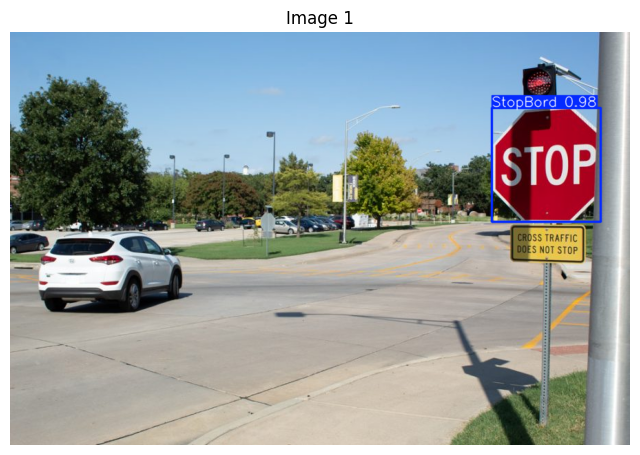

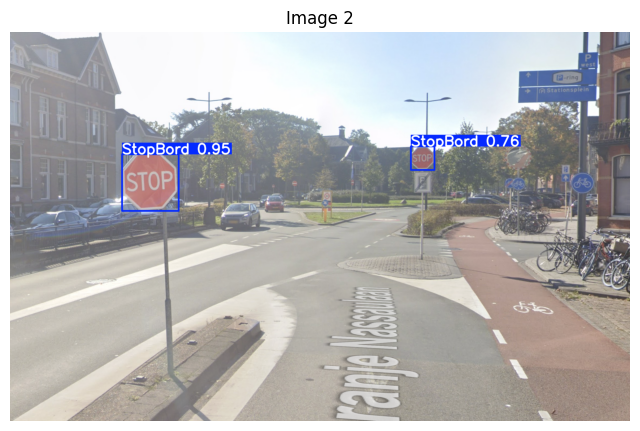

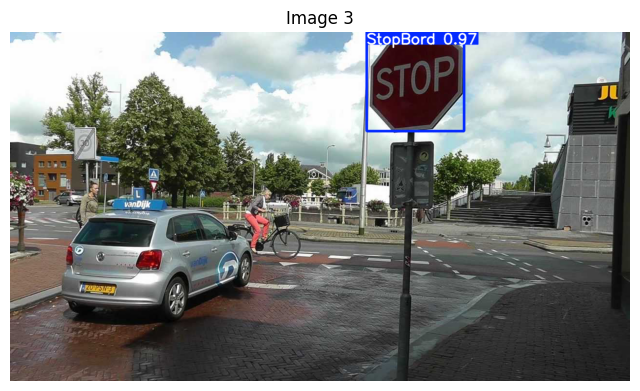

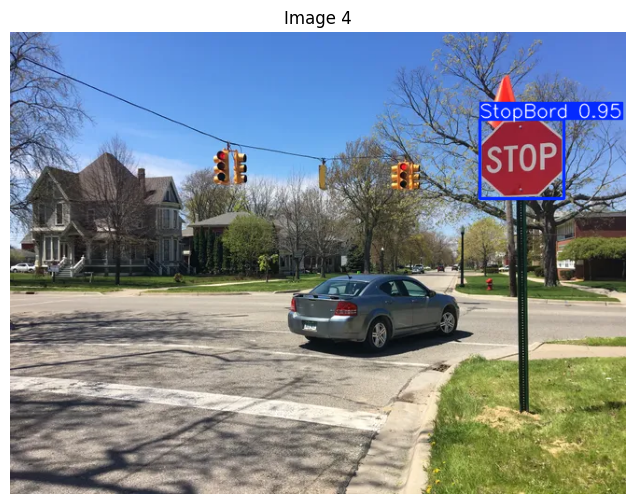

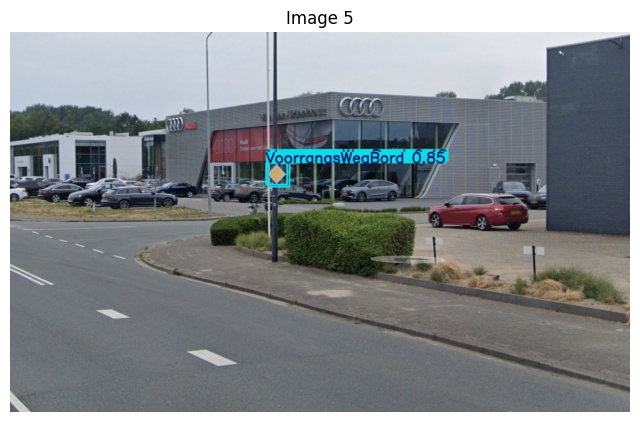

...

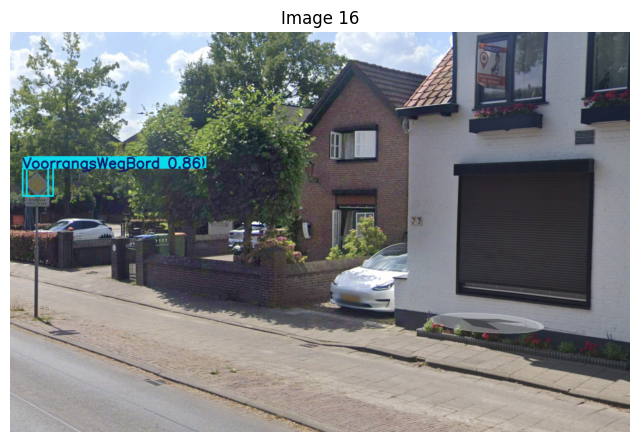

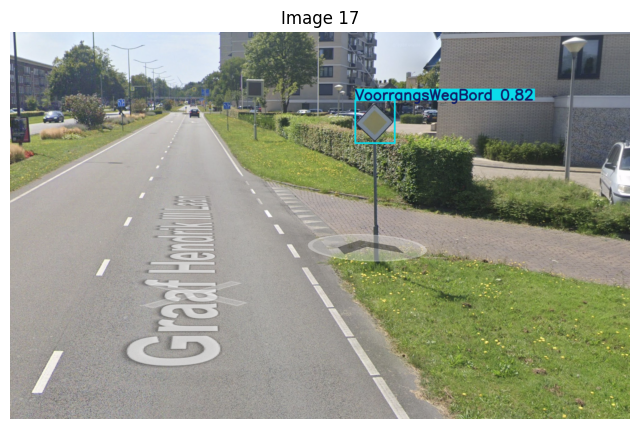

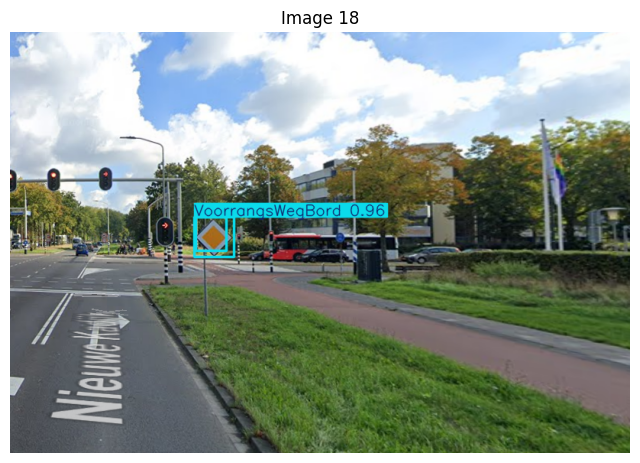

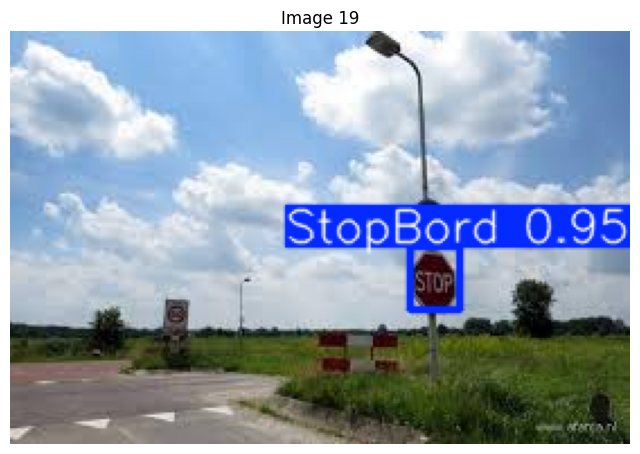

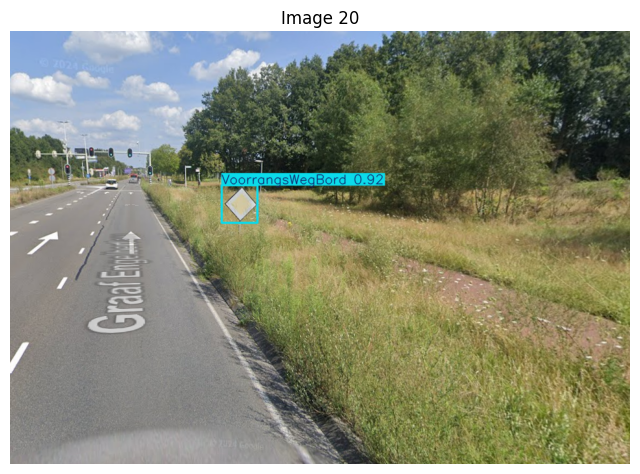

In [7]:
%matplotlib inline
import matplotlib.pyplot as plt
from ultralytics import YOLO
import cv2



# Run inference on the image
results = model("datasets/images/val", conf=0.1) 

# Loop through all images in the results and display them
for i, result in enumerate(results):
    # Render each result on the image
    annotated_image = result.plot()
    
    # Convert the image from BGR to RGB for correct color display in matplotlib
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    
    # Display the image with detections
    plt.figure(figsize=(8, 6))
    plt.imshow(annotated_image_rgb)
    plt.axis('off')  # Hide axis
    plt.title(f"Image {i+1}")
    plt.show()



In [8]:
metrics = model.val(plots=True, split="test")

Ultralytics 8.3.10 🚀 Python-3.11.8 torch-2.4.1+cu121 CUDA:1 (NVIDIA GeForce RTX 4090, 24209MiB)


val: Scanning /home2/minorai4/ml3/datasets/labels/test.cache... 10 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


                   all         10         10      0.964        0.9      0.966      0.717
              StopBord          5          5      0.969          1      0.995      0.895
      VoorrangsWegBord          5          5      0.959        0.8      0.938      0.538
Speed: 0.1ms preprocess, 13.2ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs/detect/train702


mAP: 0.7169856619357841


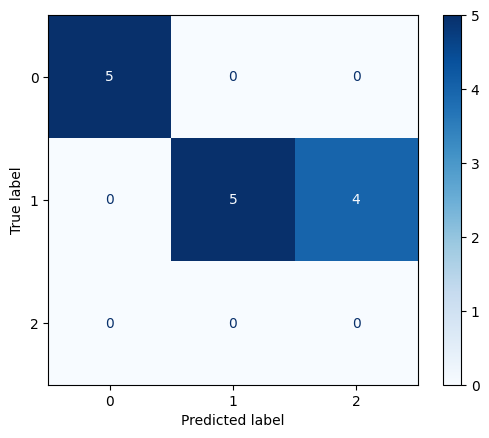

In [9]:
print(f"mAP: {metrics.box.map}")

cm = metrics.confusion_matrix.matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

disp.plot(cmap=plt.cm.Blues)

# Display the plot
plt.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=314d1488-a0fe-4210-9ea9-3c6cd35c41d6' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>